# Project

* Author: Marco Magnani


Every day crimes occur and their study and even more so their prediction has become a frequent topic.
In this project, the dataset concerning the city of Los Angeles in America was taken into consideration.
The dataset has been elaborated with classification and prediction algorithms.
The dataset is made up of over 2 million samples and has multiple attributes of more or less interest for the project.

## Libraries

List of libraries used in the project

In [1]:
%matplotlib inline

import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime
import math

from IPython.display import HTML, display
import plotly.graph_objects as go
import numpy as np

import folium
from folium.plugins import MarkerCluster

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error

from keras.models import Sequential
from keras.layers import Dense, LSTM 

Using TensorFlow backend.


## Util functions

In [2]:
def alignObjectHTML():
    display(HTML("""<style>#output-body {display: flex;align-items: center;justify-content: center;}</style>"""))
def formatNumber(n):
    return '{:,}'.format(n).replace(","," ")
def highlight_diag(df):
    a = np.full(df.shape, '', dtype='<U24')
    np.fill_diagonal(a, 'background-color: yellow')
    return pd.DataFrame(a, index=df.index, columns=df.columns)
def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

# Pre-Processing dataset

In this chapter, the dataset is read from a CSV file and has been cleaned of all unnecessary attributes.
A second part of pre-processing was to eliminate some samples because they had values that increased the disorder in the dataset.

In [3]:
# Read the dataset from CSV

original_crime_df = pd.read_csv('../input/crime-la-from-2010-to-2019/Crime_Data_from_2010_to_2019.csv')
print("Number of entries:",formatNumber(original_crime_df.shape[0]))

Number of entries: 2 114 091


In [4]:
# I clean dataset from useless attributes and strange values.

print("List of original attributes("+str(len(original_crime_df.columns))+"):",",".join(original_crime_df.columns),"\n")

dropped_attributues = ['DATE OCC','TIME OCC','Rpt Dist No','Part 1-2','Mocodes','Vict Descent','Premis Cd','Status','Status Desc','Crm Cd 1','Crm Cd 2','Crm Cd 3','Crm Cd 4']
crime_df_0 = original_crime_df.drop(columns=dropped_attributues)
crime_df_0.drop(crime_df_0[crime_df_0['Vict Sex'] == "N"].index,inplace=True)
crime_df_0.drop(crime_df_0[crime_df_0['Vict Sex'] == "H"].index,inplace=True)
crime_df = crime_df_0

print("List of new attributes("+str(len(crime_df.columns))+"):",",".join(crime_df.columns),"\n")
crime_df.head(1)

List of original attributes(28): DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA ,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON 

List of new attributes(15): DR_NO,Date Rptd,AREA ,AREA NAME,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Premis Desc,Weapon Used Cd,Weapon Desc,LOCATION,Cross Street,LAT,LON 



,DR_NO,Date Rptd,AREA,AREA NAME,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Premis Desc,Weapon Used Cd,Weapon Desc,LOCATION,Cross Street,LAT,LON
0,1307355,02/20/2010 12:00:00 AM,13,Newton,900,VIOLATION OF COURT ORDER,48,M,SINGLE FAMILY DWELLING,NaN,NaN,300 E GAGE AV,NaN,33.9825,-118.2695


In [5]:
dict_zone = {}
for index, row in crime_df.iterrows():
    if( not (int(row['AREA ']) in dict_zone)):
        dict_zone[row['AREA ']] = row['AREA NAME']
dict_zone

{13: 'Newton',
 14: 'Pacific',
 6: 'Hollywood',
 1: 'Central',
 11: 'Northeast',
 4: 'Hollenbeck',
 3: 'Southwest',
 18: 'Southeast',
 2: 'Rampart',
 20: 'Olympic',
 7: 'Wilshire',
 12: '77th Street',
 5: 'Harbor',
 8: 'West LA',
 9: 'Van Nuys',
 10: 'West Valley',
 21: 'Topanga',
 15: 'N Hollywood',
 19: 'Mission',
 16: 'Foothill',
 17: 'Devonshire'}

## Some statistics

In this chapter, data presentation work has been done. The top 15 areas with the most crimes in the whole city have been identified.

They have been positioned on a map of the crimes based on their geolocalization because the dataset has the latitutedine and longitude coordinates on where a specific crime occurred.

Here the first *observation*, the areas with the most crimes are the central areas of the city where there should be more well-being in contradiction to what is believed compared to the suburbs.

In [6]:
print("Top 15 Zone with more crimes:\n\n"+crime_df['AREA NAME'].value_counts().head(15).to_string())

# Center the map on Los Angeles
Map_1 = folium.Map(location=[34.0522300, -118.2436800],zoom_start=10,width="70%",height="100%",tiles="OpenStreetMap")
marker_cluster = MarkerCluster().add_to(Map_1)

for index,row in crime_df.head(10000).iterrows(): # 500.000
    folium.Marker(location=[float(row['LAT']), float(row['LON'])], popup=row['Crm Cd Desc']).add_to(marker_cluster)

Map_1

Top 15 Zone with more crimes:

77th Street    145191
Southwest      135356
N Hollywood    113834
Pacific        112459
Southeast      111419
Mission        103475
Northeast      100174
Newton          99947
Van Nuys        99647
Hollywood       98934
Central         98231
Topanga         97526
Devonshire      96395
Olympic         95262
Harbor          91935


Another study that has been done concerns the percentage of male and female victims compared to areas.

Here we can observe that there is a good homogeneity of the values of the victims between men and women with the exception of 2 areas where it is very evident that women are much more affected.

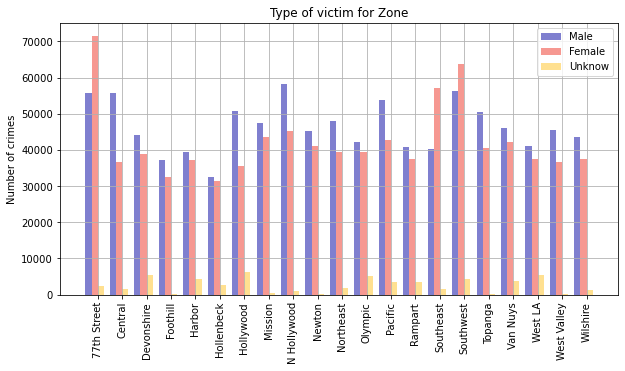

In [7]:
# Count the victim for type
MaleZoneCrime = crime_df[crime_df['Vict Sex'] == "M"].groupby('AREA NAME')['Vict Sex'].value_counts()
FemaleZoneCrime = crime_df[crime_df['Vict Sex'] == "F"].groupby('AREA NAME')['Vict Sex'].value_counts()
UnknowZoneCrime = crime_df[crime_df['Vict Sex'] == "X"].groupby('AREA NAME')['Vict Sex'].value_counts()

numberMale      = MaleZoneCrime.values
numberFemale    = FemaleZoneCrime.values
numberUnknow    = UnknowZoneCrime.values
zoneName        = sorted(crime_df['AREA NAME'].unique())

# Setting the positions and width for the bars
pos = list(range(len(numberMale))) 
width = 0.25 
fig, ax = plt.subplots(figsize=(10,5))

plt.bar(pos, numberMale,width,alpha=0.5,color='#0000A0') 
plt.bar([p + width for p in pos],numberFemale,width,alpha=0.5,color='#EE3224') 
plt.bar([p + width*2 for p in pos],numberUnknow,width,alpha=0.5,color='#FFC222') 

ax.set_ylabel('Number of crimes')
ax.set_title('Type of victim for Zone')
ax.set_xticks([p + 1.5 * width for p in pos])
ax.set_xticklabels(zoneName,rotation='vertical')

plt.legend(['Male', 'Female', 'Unknow'], loc='upper right')
plt.grid()
plt.show()

A fast print about top 15 crimes.

In [8]:
print("\n\nTop 15 crimes:\n\n"+crime_df['Crm Cd Desc'].value_counts().head(15).to_string())



Top 15 crimes:

BATTERY - SIMPLE ASSAULT                                    190527
BURGLARY FROM VEHICLE                                       162145
VEHICLE - STOLEN                                            159845
THEFT PLAIN - PETTY ($950 & UNDER)                          149793
BURGLARY                                                    147609
THEFT OF IDENTITY                                           126786
INTIMATE PARTNER - SIMPLE ASSAULT                           114529
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)     109428
ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT               92697
VANDALISM - MISDEAMEANOR ($399 OR UNDER)                     90417
THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)              88465
ROBBERY                                                      83850
THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD     74499
CRIMINAL THREATS - NO WEAPON DISPLAYED                       56633
SHOPLIFTING - PETTY THEFT ($950 & UNDER)    

This representation concerns the evolution of crime by year by area.
As is evident from 2010 to 2014, the number of crimes in all areas has maintained an approximately constant trend from 2014 onwards, the number of crimes has grown in all areas.

In [9]:
zoneAndCrime = {}
years = list(range(2010,2020))

for zone in zoneName:
    nCrimes = [];
    for year in years:
        nCrimes.append((crime_df[(crime_df['Date Rptd'].str.contains(str(year),case=False,regex=False)) & (crime_df['AREA NAME'] == zone)]['AREA NAME'].value_counts().values).tolist()[0])
    zoneAndCrime[zone] = nCrimes

listGraph = []
n = 0
for zone in zoneName:
    newList = []
    for i in zoneAndCrime[zone]:
        newList.append(i)
    hide = "legendonly"
    if(n % 3 == 0):
        hide = True
    listGraph.append(go.Scatter(x=years, y=newList,name=zone, visible=hide));
    n += 1

fig = go.Figure(data=listGraph)
fig.update_layout(width=1024,height=650,title="Evolution crime for zone and year",xaxis=dict(title='Year',tickmode='linear'),yaxis=dict(title='Number of crimes'))

fig.show()

## Classification - Random Forest

The first algorithm we are going to see concerns a classification.
The algorithm is the Random Forest. The random forest uses decision trees.

The algorithm takes a number of features as input and classifies them.

The classes of classification are the type of crime.

### Pre-Processing dataset for classification

In [10]:
crime_df.head(5)

,DR_NO,Date Rptd,AREA,AREA NAME,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Premis Desc,Weapon Used Cd,Weapon Desc,LOCATION,Cross Street,LAT,LON
0,1307355,02/20/2010 12:00:00 AM,13,Newton,900,VIOLATION OF COURT ORDER,48,M,SINGLE FAMILY DWELLING,NaN,NaN,300 E GAGE AV,NaN,33.9825,-118.2695
1,11401303,09/13/2010 12:00:00 AM,14,Pacific,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0,M,STREET,NaN,NaN,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962
2,70309629,08/09/2010 12:00:00 AM,13,Newton,946,OTHER MISCELLANEOUS CRIME,0,M,ALLEY,NaN,NaN,1300 E 21ST ST,NaN,34.0224,-118.2524
3,90631215,01/05/2010 12:00:00 AM,6,Hollywood,900,VIOLATION OF COURT ORDER,47,F,STREET,102.0,HAND GUN,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295
4,100100501,01/03/2010 12:00:00 AM,1,Central,122,"RAPE, ATTEMPTED",47,F,ALLEY,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",8TH ST,SAN PEDRO ST,34.0387,-118.2488


I removed some attributes from the dataset because they are not important.

In [11]:
# I remove the useless attributes.
dropped_attributues = ['DR_NO','Date Rptd','AREA NAME','Crm Cd','Premis Desc','Weapon Desc','LOCATION','Cross Street']
crime_df_1 = crime_df.drop(columns=dropped_attributues)

# I remove the entries that it has not a weapon's code avaible.(NaN)
crime_df_1 = crime_df_1.dropna()
crime_df_1.head(1)

,AREA,Crm Cd Desc,Vict Age,Vict Sex,Weapon Used Cd,LAT,LON
3,6,VIOLATION OF COURT ORDER,47,F,102.0,34.1016,-118.3295


In [12]:
# I move the class to last column
crime_df_1 = crime_df_1[['AREA ','Vict Age','Vict Sex','LAT','LON','Weapon Used Cd','Crm Cd Desc']]
crime_df_1.head()

,AREA,Vict Age,Vict Sex,LAT,LON,Weapon Used Cd,Crm Cd Desc
3,6,47,F,34.1016,-118.3295,102.0,VIOLATION OF COURT ORDER
4,1,47,F,34.0387,-118.2488,400.0,"RAPE, ATTEMPTED"
7,1,51,M,34.0435,-118.2427,500.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
8,1,30,M,34.0450,-118.2640,400.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
10,1,38,F,34.0640,-118.2375,400.0,BATTERY - SIMPLE ASSAULT


To lighten the workload on the algorithm, I decided to analyze only the most frequent classes.

In [13]:
list_top_3_crimes = crime_df_1['Crm Cd Desc'].value_counts().head(3).index
print("Top 3 crimes:\n\n",list_top_3_crimes)

Top 3 crimes:

 Index(['BATTERY - SIMPLE ASSAULT', 'INTIMATE PARTNER - SIMPLE ASSAULT',
       'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT'],
      dtype='object')


In [14]:
crime_df_1 = crime_df_1[crime_df_1['Crm Cd Desc'].isin(list_top_3_crimes)]
crime_df_1.head()

,AREA,Vict Age,Vict Sex,LAT,LON,Weapon Used Cd,Crm Cd Desc
7,1,51,M,34.0435,-118.2427,500.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
8,1,30,M,34.0450,-118.2640,400.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
10,1,38,F,34.0640,-118.2375,400.0,BATTERY - SIMPLE ASSAULT
20,1,28,M,34.0502,-118.2540,400.0,INTIMATE PARTNER - SIMPLE ASSAULT
23,1,36,F,34.0382,-118.2665,400.0,BATTERY - SIMPLE ASSAULT


In this phase, normalize the remaining labels of my dataset to bring them to numerical values.

In [15]:
# I change the labales for sex of victim with numeric value.
crime_df_1.loc[crime_df_1['Vict Sex'] == 'F', 'Vict Sex'] = 1
crime_df_1.loc[crime_df_1['Vict Sex'] == 'M', 'Vict Sex'] = 0
crime_df_1.loc[crime_df_1['Vict Sex'] == 'X', 'Vict Sex'] = 2
crime_df_1

,AREA,Vict Age,Vict Sex,LAT,LON,Weapon Used Cd,Crm Cd Desc
7,1,51,0,34.0435,-118.2427,500.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
8,1,30,0,34.0450,-118.2640,400.0,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
10,1,38,1,34.0640,-118.2375,400.0,BATTERY - SIMPLE ASSAULT
20,1,28,0,34.0502,-118.2540,400.0,INTIMATE PARTNER - SIMPLE ASSAULT
23,1,36,1,34.0382,-118.2665,400.0,BATTERY - SIMPLE ASSAULT
...,...,...,...,...,...,...,...
2114062,5,39,1,33.7478,-118.2817,400.0,BATTERY - SIMPLE ASSAULT
2114068,5,46,1,33.7749,-118.2750,400.0,INTIMATE PARTNER - SIMPLE ASSAULT
2114074,20,32,1,34.0463,-118.2904,400.0,INTIMATE PARTNER - SIMPLE ASSAULT
2114078,3,61,1,34.0073,-118.3182,400.0,INTIMATE PARTNER - SIMPLE ASSAULT


Normalize the classification categories as numeric values.

In [16]:
#Creating the dependent variable class
factor = pd.factorize(crime_df_1['Crm Cd Desc'])
crime_df_1['Crm Cd Desc'] = factor[0]
definitions = factor[1]
print("All possible classes:")
print(definitions)

All possible classes:
Index(['ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
       'BATTERY - SIMPLE ASSAULT', 'INTIMATE PARTNER - SIMPLE ASSAULT'],
      dtype='object')


In [17]:
crime_df_1

,AREA,Vict Age,Vict Sex,LAT,LON,Weapon Used Cd,Crm Cd Desc
7,1,51,0,34.0435,-118.2427,500.0,0
8,1,30,0,34.0450,-118.2640,400.0,0
10,1,38,1,34.0640,-118.2375,400.0,1
20,1,28,0,34.0502,-118.2540,400.0,2
23,1,36,1,34.0382,-118.2665,400.0,1
...,...,...,...,...,...,...,...
2114062,5,39,1,33.7478,-118.2817,400.0,1
2114068,5,46,1,33.7749,-118.2750,400.0,2
2114074,20,32,1,34.0463,-118.2904,400.0,2
2114078,3,61,1,34.0073,-118.3182,400.0,2


In this phase I prepare the datasets, training and testing to be input to my algorithm.

In [18]:
#Splitting the data into independent and dependent variables
X = crime_df_1.iloc[:,0:6].values
y = crime_df_1.iloc[:,6].values
print('The independent features set: ')
print(X[:5,:])
print('The dependent variable: ')
print(y[:5])

The independent features set: 
[[1 51 0 34.0435 -118.2427 500.0]
 [1 30 0 34.045 -118.264 400.0]
 [1 38 1 34.064 -118.2375 400.0]
 [1 28 0 34.0502 -118.25399999999999 400.0]
 [1 36 1 34.0382 -118.2665 400.0]]
The dependent variable: 
[0 0 1 2 1]


I use the 70% for training and 30% for testing.

In [19]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [20]:
# Run the algorithm
classifier = RandomForestClassifier(n_estimators=200,criterion='gini')
classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200)

In [21]:
# Predicting
y_pred = classifier.predict(X_test)

#print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.80      0.81     27890
           1       0.67      0.73      0.70     56719
           2       0.54      0.48      0.51     32457

    accuracy                           0.68    117066
   macro avg       0.68      0.67      0.67    117066
weighted avg       0.67      0.68      0.67    117066

0.6763449677959442


In [22]:
reversefactor = dict(zip(range(len(definitions)),definitions))
reversefactor

{0: 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
 1: 'BATTERY - SIMPLE ASSAULT',
 2: 'INTIMATE PARTNER - SIMPLE ASSAULT'}

In [23]:
y_test_backup = y_test # I save this variable because I will use after.

# Reverse the normalizzation
y_test = np.vectorize(reversefactor.get)(y_test)
y_pred = np.vectorize(reversefactor.get)(y_pred)

# Making the Confusion Matrix
cross = pd.crosstab(y_test, y_pred, rownames=['Actual Crimes'], colnames=['Predicted Crimes'])

In [24]:
cross.style.apply(highlight_diag, axis=None)

Predicted Crimes,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",BATTERY - SIMPLE ASSAULT,INTIMATE PARTNER - SIMPLE ASSAULT
Actual Crimes,,,
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",22289,4658,943
BATTERY - SIMPLE ASSAULT,3278,41414,12027
INTIMATE PARTNER - SIMPLE ASSAULT,1411,15572,15474


The accuracy is about 67% but the loader is very important for the algorithm, so I tried to improve the algorithm with reducing the number of the featues.
Using the RandomForest classifier I selected the feature with threshold has a value >= 0.15.

In [25]:
# Based on prevous random forest modeler I selecte the best features.
sfm = SelectFromModel(classifier, threshold=0.15)
sfm.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(n_estimators=200),
                threshold=0.15)

In [26]:
sfm.get_support(indices=True)

array([1, 3, 4, 5])

In [27]:
# Transform the data to create a new dataset containing only the most important features
X_important_train = sfm.transform(X_train)
X_important_test = sfm.transform(X_test)

In [28]:
# Create a new random forest classifier for the most important features
clf_important = RandomForestClassifier(n_estimators=200,criterion = 'gini')

# Train the new classifier on the new dataset containing the most important features
clf_important.fit(X_important_train, y_train)

RandomForestClassifier(n_estimators=200)

In [29]:
y_test = y_test_backup

In [30]:
# Predicting the Test set results
y_pred_important = clf_important.predict(X_important_test)

#print(confusion_matrix(y_test,y_pred_important))
print(classification_report(y_test,y_pred_important))
print(accuracy_score(y_test, y_pred_important))

              precision    recall  f1-score   support

           0       0.81      0.79      0.80     27890
           1       0.65      0.71      0.68     56719
           2       0.49      0.43      0.46     32457

    accuracy                           0.65    117066
   macro avg       0.65      0.64      0.65    117066
weighted avg       0.65      0.65      0.65    117066

0.6523841251943349


In [31]:
# Reverse the normalizzation
y_test = np.vectorize(reversefactor.get)(y_test)
y_pred = np.vectorize(reversefactor.get)(y_pred_important)

# Making the Confusion Matrix
cross = pd.crosstab(y_test, y_pred, rownames=['Actual Crimes'], colnames=['Predicted Crimes'])

In [32]:
cross.style.apply(highlight_diag, axis=None)

Predicted Crimes,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",BATTERY - SIMPLE ASSAULT,INTIMATE PARTNER - SIMPLE ASSAULT
Actual Crimes,,,
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",22022,4572,1296
BATTERY - SIMPLE ASSAULT,3380,40540,12799
INTIMATE PARTNER - SIMPLE ASSAULT,1649,16998,13810


We see a reduced of accuracy this because we removed a feature from model but the decrease of accuracy is justified from reduced of input size.

## Zona

In [33]:
zonaUnderExam_id = 14
zonaUnserExam_name = dict_zone[zonaUnderExam_id]
print("ID=",zonaUnderExam_id,"Name=",zonaUnserExam_name)

ID= 14 Name= Pacific


## Predictions - LSTM and RandomForest

In this section we will see the prediction algorithms, we will use LSTM (Long short time machine) and Random Forest.
The purpose of the section is to create a model on which to predict the number of crimes that will occur in the future.

A dataset remodeling work was done to bring our original dataset into the form:
 **<date, zona, quantita>** 
That is, the total number of monthly crimes that occurred in a given area.
(Given the large amount of work to which this notebook was subjected, it was preferred to perform this pre-processing work on a separate notebook with the use of GPU)

### LSTM - Long short time machine

Long short-term memory (LSTM) is an artificial recurrent neural network (RNN) architecture used in the field of machine learning.
LSTM networks are well-suited to classifying, processing and making predictions based on time series data, since there can be lags of unknown duration between important events in a time series.

In [34]:
np.set_printoptions(suppress=True)
# Load the new dataset splitted by month
df = pd.read_csv('../input/crime-for-lstm-mesi-from-2010-to-2019csv/Crime_FOR_LSTM_MESI_from_2010_to_2019.csv')
df = df.rename(columns={'Unnamed: 0': 'id'}) # I rename the first column.
df = df.drop('id', 1)
print("Len dataset ",len(df))
df.head()

Len dataset  2520


,data,zona,quantita
0,2010-01,1,613
1,2010-02,1,473
2,2010-03,1,612
3,2010-04,1,562
4,2010-05,1,610


This function is very important because I am modeling the input dataset based on a number of days that I look back on.

The idea on which I based my LSTM model is to see what happened at time T and predict what happens at time T + 1.

In [35]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

I choose a zone that I want to study and I remove all other areas.

In [36]:
zona = zonaUnderExam_id

dataset = df[(df['zona'] == zona)]
dataset = dataset.drop('zona', 1)
dataset = dataset.drop('data', 1)
dataset = dataset.values
dataset = dataset.astype('int32')
dataset

array([[ 964],
       [ 805],
       [ 950],
       [ 895],
       [ 956],
       [ 926],
       [ 942],
       [ 953],
       [ 917],
       [ 980],
       [ 864],
       [ 931],
       [ 877],
       [ 742],
       [ 851],
       [ 905],
       [ 911],
       [ 928],
       [ 931],
       [ 889],
       [ 896],
       [ 825],
       [ 770],
       [ 844],
       [ 910],
       [ 764],
       [ 902],
       [ 846],
       [ 893],
       [ 792],
       [ 869],
       [ 910],
       [ 857],
       [ 877],
       [ 829],
       [ 855],
       [ 811],
       [ 712],
       [ 796],
       [ 788],
       [ 888],
       [ 820],
       [ 881],
       [ 908],
       [ 873],
       [ 882],
       [ 914],
       [ 828],
       [ 867],
       [ 834],
       [ 919],
       [ 833],
       [ 931],
       [ 844],
       [ 928],
       [ 951],
       [ 932],
       [ 908],
       [ 864],
       [ 935],
       [1088],
       [ 867],
       [1016],
       [ 968],
       [ 967],
       [ 980],
       [10

In [37]:
list_graphs = []
graph_1 = go.Scatter(x=list(range(0,len(dataset))),y=dataset.flatten(),name="Dataset")
list_graphs.append(graph_1)
average = moving_average(dataset)
graph_2 = go.Scatter(x=list(range(0,len(dataset))),y=average,name="Average")
list_graphs.append(graph_2)
fig = go.Figure(data=list_graphs)
fig.update_layout(width=1024,height=500,title="Dataset of crimes in "+dict_zone[zona],xaxis=dict(title='Month'),yaxis=dict(title='Number of crimes'))

fig.show()

I have 120 entries because I have 10 years

In [38]:
len(dataset)

120

![](http://)LSTM works by a sigmoid function as recurrent_activation. I tried also other functions: relu, tanh, ect.. but the best has been the sigmoide the same for activation fucntion.

![Functions](https://miro.medium.com/max/1190/1*f9erByySVjTjohfFdNkJYQ.jpeg)

For work with LSTM we have to rescale the dataset. At first, I had used the function MinMaxer but the accuracy after running the model was low. So I studied the graph and I saw that there are many outliners and after research I found another function, the RobustScaler. The RobustScaler is based on the same approach of MinMaxScaler but with more attention on outliners, and using this function the model is improved.

In [39]:
# Scaler the dataset
scaler = RobustScaler()
dataset = scaler.fit_transform(dataset)
#scaler = MinMaxScaler(feature_range=(0, 1))
#dataset = scaler.fit_transform(dataset)

In [40]:
# Split the dataset with 70% for training and 30% for testing.
train_size = int(len(dataset) * 0.7)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

In [41]:
# I make my dataset
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [42]:
trainX.shape, trainY.shape, testX.shape, testY.shape

((83, 1), (83,), (35, 1), (35,))

Another improvement that I did, it has been the reshape the size of dataset, this because the LSTM works well with these sizes.

In [43]:
trainX = np.reshape(trainX, (trainX.shape[0],1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0],1, testX.shape[1]))

This is the heart of Model.
I make a model with 2 layers with 8 and 4 units as input and 1 layer of ouput.
The model uses the 500 epochs with batch size of 4 unit.

In [44]:
model = Sequential()
model.add(LSTM(8,return_sequences=True, input_shape=(1,look_back)))
model.add(LSTM(4,return_sequences=False, input_shape=(1,look_back)))

model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='rmsprop')
model.fit(trainX, trainY, epochs=500, batch_size=4, verbose=2)

Epoch 1/500
21/21 - 0s - loss: 0.3578
Epoch 2/500
21/21 - 0s - loss: 0.3459
Epoch 3/500
21/21 - 0s - loss: 0.3375
Epoch 4/500
21/21 - 0s - loss: 0.3308
Epoch 5/500
21/21 - 0s - loss: 0.3236
Epoch 6/500
21/21 - 0s - loss: 0.3176
Epoch 7/500
21/21 - 0s - loss: 0.3114
Epoch 8/500
21/21 - 0s - loss: 0.3062
Epoch 9/500
21/21 - 0s - loss: 0.3013
Epoch 10/500
21/21 - 0s - loss: 0.2966
Epoch 11/500
21/21 - 0s - loss: 0.2926
Epoch 12/500
21/21 - 0s - loss: 0.2891
Epoch 13/500
21/21 - 0s - loss: 0.2855
Epoch 14/500
21/21 - 0s - loss: 0.2820
Epoch 15/500
21/21 - 0s - loss: 0.2787
Epoch 16/500
21/21 - 0s - loss: 0.2758
Epoch 17/500
21/21 - 0s - loss: 0.2725
Epoch 18/500
21/21 - 0s - loss: 0.2700
Epoch 19/500
21/21 - 0s - loss: 0.2673
Epoch 20/500
21/21 - 0s - loss: 0.2650
Epoch 21/500
21/21 - 0s - loss: 0.2626
Epoch 22/500
21/21 - 0s - loss: 0.2609
Epoch 23/500
21/21 - 0s - loss: 0.2590
Epoch 24/500
21/21 - 0s - loss: 0.2578
Epoch 25/500
21/21 - 0s - loss: 0.2563
Epoch 26/500
21/21 - 0s - loss: 0.

Run the predictions.

In [45]:
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

I return the original value coming back to values not scaler.

In [46]:
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [47]:
trainY[0],trainPredict[:,0]

(array([ 805.,  950.,  895.,  956.,  926.,  942.,  953.,  917.,  980.,
         864.,  931.,  877.,  742.,  851.,  905.,  911.,  928.,  931.,
         889.,  896.,  825.,  770.,  844.,  910.,  764.,  902.,  846.,
         893.,  792.,  869.,  910.,  857.,  877.,  829.,  855.,  811.,
         712.,  796.,  788.,  888.,  820.,  881.,  908.,  873.,  882.,
         914.,  828.,  867.,  834.,  919.,  833.,  931.,  844.,  928.,
         951.,  932.,  908.,  864.,  935., 1088.,  867., 1016.,  968.,
         967.,  980., 1058., 1043., 1012.,  865.,  885.,  966.,  992.,
         848.,  888.,  971., 1015., 1027., 1081.,  975., 1017., 1009.,
         946., 1001.]),
 array([941.94226, 861.98364, 930.51074, 890.74445, 935.47406, 911.0936 ,
        923.8716 , 932.9993 , 904.4924 , 953.8558 , 876.8639 , 914.96875,
        881.9949 , 854.669  , 872.5499 , 896.55853, 900.3956 , 912.6277 ,
        914.96875, 887.59393, 891.2937 , 865.83374, 857.1953 , 870.51495,
        899.7379 , 856.5703 , 894.7385 , 

In [48]:
testY[0],testPredict[:,0]

(array([ 858., 1081., 1043., 1013.,  988., 1045., 1068., 1069.,  997.,
        1008.,  981.,  992.,  862.,  988., 1021., 1025., 1000., 1044.,
        1099., 1062., 1051., 1005., 1007., 1058.,  899., 1042.,  996.,
        1020.,  947., 1139., 1078., 1070.,  972.,  949.,  992.]),
 array([899.08746, 874.7804 , 987.8526 , 981.7636 , 972.11945, 959.11066,
        982.2252 , 986.3259 , 986.4609 , 964.38745, 969.92194, 954.5407 ,
        961.54004, 876.1508 , 959.11066, 975.2516 , 976.6521 , 965.9953 ,
        981.9968 , 989.2836 , 985.448  , 983.4994 , 968.50995, 969.4592 ,
        984.7932 , 892.9838 , 981.5256 , 963.83484, 974.88477, 928.0168 ,
        990.5832 , 987.54175, 986.59265, 948.10767, 929.67957],
       dtype=float32))

In [49]:
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 65.50 RMSE
Test Score: 82.59 RMSE


In [50]:
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

In [51]:
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back):len(dataset)-1, :] = testPredict

In [52]:
listGraph = []
listGraph.append(go.Scatter(x=list(range(0,len(dataset))),y=scaler.inverse_transform(dataset).flatten(),name="Original dataset"))
listGraph.append(go.Scatter(x=list(range(0,len(trainPredictPlot))),y=trainPredictPlot.flatten(),name="Predict with Train set"))
listGraph.append(go.Scatter(x=list(range(0,len(testPredictPlot))),y=testPredictPlot.flatten(),name="Predict with Train set"))

fig = go.Figure(data=listGraph)
fig.update_layout(width=1024,height=500,title="[LSTM] Prediction for "+dict_zone[zona],xaxis=dict(title='Month'),yaxis=dict(title='Number of crimes'))

fig.show()

As we can consider the result acceptable for the model but use the LSTM for prediction the future is not the best choose in this case.

### Prediction - RandomForest

I used the random forest to solve a prediction problem.

In [53]:
# I read the dataset, that is the same datase used for LSTM.
df = pd.read_csv('../input/crime-for-lstm-mesi-from-2010-to-2019csv/Crime_FOR_LSTM_MESI_from_2010_to_2019.csv')
df = df.rename(columns={'Unnamed: 0': 'id'})
df = df.drop('id', 1)
print("Lenght dataset ",len(df))

zona = zonaUnderExam_id
dataset = df[(df['zona'] == zona)]
dataset = dataset.drop('zona', 1)
dataset = dataset.drop('data', 1)
dataset

Lenght dataset  2520


,quantita
1560,964
1561,805
1562,950
1563,895
1564,956
...,...
1675,1078
1676,1070
1677,972
1678,949


In [54]:
r = np.arange(0,120,1).tolist()
dataset['month'] = r
dataset

,quantita,month
1560,964,0
1561,805,1
1562,950,2
1563,895,3
1564,956,4
...,...,...
1675,1078,115
1676,1070,116
1677,972,117
1678,949,118


In [55]:
x = dataset['month'].values.reshape(-1, 1)
y = dataset['quantita'].values.reshape(-1, 1)
x_train_rdf, x_test_rdf, y_train_rdf, y_test_rdf = train_test_split(x, y, test_size=0.30)

In [56]:
rd = RandomForestRegressor()
rd.fit(x_train_rdf,y_train_rdf)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor()

In [57]:
y_pred_rdf = rd.predict(x_test_rdf)
y_test_rdf,y_pred_rdf

(array([[ 910],
        [1078],
        [ 855],
        [ 764],
        [ 889],
        [1015],
        [ 858],
        [1081],
        [ 844],
        [ 833],
        [1008],
        [ 867],
        [1000],
        [ 844],
        [ 834],
        [ 742],
        [ 914],
        [ 928],
        [ 848],
        [1009],
        [ 909],
        [ 788],
        [1088],
        [ 992],
        [ 805],
        [ 825],
        [ 846],
        [1058],
        [1069],
        [ 926],
        [ 899],
        [1005],
        [ 862],
        [ 885],
        [ 910],
        [ 877]]),
 array([ 816.19, 1093.44,  825.45,  870.86,  922.35,  980.04, 1004.6 ,
        1030.54,  817.44,  914.42,  997.14,  978.82, 1030.95,  934.83,
         879.47,  878.29,  870.83,  943.68,  915.36, 1002.41,  990.38,
         808.16,  918.35,  937.65,  956.05,  876.87,  887.08, 1019.49,
        1047.34,  948.2 , 1028.82, 1042.43,  992.  ,  912.51,  859.47,
         907.11]))

In [58]:
# Plot the data.
listGraph = []
listGraph.append(go.Scatter(x=list(range(0,35)),y=y_test_rdf.flatten(),name="Test set"))
listGraph.append(go.Scatter(x=list(range(0,35)),y=y_pred_rdf,name="Predict set"))
fig = go.Figure(data=listGraph)
fig.update_layout(width=1024,height=500,title="Prediction for "+dict_zone[zona],xaxis=dict(title='Month',tickmode='linear'),yaxis=dict(title='Number of crimes'))

fig.show()

In [59]:
last_df = pd.DataFrame()
last_df['Test'] = y_test_rdf.flatten()
last_df['Predicted'] = y_pred_rdf
last_df

,Test,Predicted
0,910,816.19
1,1078,1093.44
2,855,825.45
3,764,870.86
4,889,922.35
5,1015,980.04
6,858,1004.60
7,1081,1030.54
8,844,817.44
9,833,914.42


## Conclusion

We can conclude that predicting the number of crimes that will occur in the future is a very complicated topic to make because the evolution of the crime is affected a lot by external factors, for example the well-being of the neighborhood.

A future work that could be done to improve the results obtained in this work is to intertwine the database with other databases related to other social factors.